# Project Group - 14

## Research question: - Google Mobility Relative Questions

Members (Student numbers): Max, Li(5944058);Mingyan, Jin(6050972);Heran, Zhao(5925320) 

# Background

 - The COVID-19 pandemic, caused by the novel coronavirus SARS-CoV-2, has had a profound impact on the United States since its emergence in early 2020. The spread of the virus and its associated morbidity and mortality have exhibited significant variation across different states. In this study, we aim to provide a detailed background analysis of the COVID-19 situation in the United States, with a particular focus on New York State. New York was selected for further study due to the high number of COVID-19 related deaths it experienced in 2021, making it one of the most severely affected states in the country.
 - New York State was chosen for further study due to its unique position as an early epicenter of the pandemic in the United States. The state experienced a high number of COVID-19 cases and deaths during the initial wave of the virus in the spring of 2020. Furthermore, in 2021, New York recorded one of the highest numbers of COVID-19 related deaths in the entire country. This made New York a critical case study to understand the impact of the pandemic on a densely populated state with a significant healthcare system.

# Research Objective

### Data Collection and Processing
- Gather relevant data from New York State and the State of California, including COVID-19 infection numbers from the US_Covid dataset and mobility data from the US_Mobility dataset.
- Select and preprocess data to focus on key variables, including infected numbers and six mobility-related columns, aligning them for comparative analysis.

### Data Visualization and Interactivity
- Create interactive visualizations to present the selected data effectively.
- Develop line graphs and other visual representations to illustrate trends and correlations.

### Correlation Analysis
- Perform a comprehensive correlation analysis between mobility patterns and COVID-19 infection rates in both New York State and California.
- Identify correlations that reveal potential changes in residents' travel behaviors in response to the pandemic.
- Explore correlations such as the impact of COVID-19 on commuting frequency, park visitation, and time spent at home.-

### Storytelling Through Data
- Uncover and narrate the insights gained from the correlation analysis.
- Highlight the relationships between COVID-19 infection rates and mobility patterns in urban areas.
- Interpret the findings to understand how the pandemic affected travel behavior and influenced transportation, aid resources, and t
ravel policies.
ravel policies.
el policies.


# Data Collection and Processing

`US_Mobility2021.csv` is the 2021 U.S. Transportation Mobility data, which contains statistics for each state for six daily traffic situations, which are `retail and recreation percent change`，`grocery and pharmacy percent change`，`parks percent change`，`transit stations percent`，`workplaces percent change`，`residential percent change`.

## Data Used

The main data examined by our group are statistics on the distribution of covid in U.S. in different situations in different states in 2021.

google mobility data: https://www.google.com/covid19/mobility/

covid infected data: https://github.com/owid/covid-19-data/blob/master/public/data/hospitalizations/locations.csv 

## import of Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import seaborn as sns
import plotly.graph_objs as go
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from IPython.display import display, Markdown
import warnings
from plotly.offline import plot

## Data import

In [2]:
# Load the data
dfcovid = pd.read_csv('US_Covid.csv')
dfcovid['date'] = pd.to_datetime(dfcovid['date'])
dfcovid = dfcovid.sort_values(by='date')
dfcovid.head()

,state,date,critical_staffing_shortage_today_yes,critical_staffing_shortage_today_no,critical_staffing_shortage_today_not_reported,critical_staffing_shortage_anticipated_within_week_yes,critical_staffing_shortage_anticipated_within_week_no,critical_staffing_shortage_anticipated_within_week_not_reported,hospital_onset_covid,hospital_onset_covid_coverage,...,previous_day_admission_pediatric_covid_confirmed_5_11_coverage,previous_day_admission_pediatric_covid_confirmed_unknown,previous_day_admission_pediatric_covid_confirmed_unknown_coverage,staffed_icu_pediatric_patients_confirmed_covid,staffed_icu_pediatric_patients_confirmed_covid_coverage,staffed_pediatric_icu_bed_occupancy,staffed_pediatric_icu_bed_occupancy_coverage,total_staffed_pediatric_icu_beds,total_staffed_pediatric_icu_beds_coverage,Demo | State Geographic Boundaries
31596,LA,2020-01-01,0,0,1,0,0,1,NaN,0,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
30836,MT,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
129,NC,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
32307,PR,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
29601,MN,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN


# Data Visualization and interactivity

In the scope of our research project, our primary emphasis revolves around the analysis of crucial statistics, specifically concerning the following key metrics: the total count of adult patients hospitalized with confirmed cases and the total number of fatalities.

Fistly we write two pieces of code by using choropleth from plotly express, which is about the animation of the distribution of the number of people total adult patients hospitalized confirmed and deaths in each state in the United States in 2021. 

In [3]:
# Choropleth map
fig = px.choropleth(dfcovid,
                   locations='state', 
                   locationmode='USA-states',
                   color='total_adult_patients_hospitalized_confirmed_covid',
                   hover_name='state',
                   animation_frame='date',
                   title='COVID hospitalized comfirmed by State over Time',
                   color_continuous_scale='YlGnBu',
                   scope='usa'
                  )
fig.show()
# the animation is shown in another html file called "choropleth_map.html"
#plot(fig, filename='choropleth_map.html', auto_open=False)

Then we analyzed the two sets of data separately.

first with a line graph of the overall number of diagnoses in the U.S. despite time.

In [4]:
# there is a ineliminatable future warning in this cell, I'll tried to use its recommandation np.array and update matplot.express, none of them worked
warnings.simplefilter(action='ignore', category=FutureWarning)

# Line chart
fig = px.line(dfcovid, x='date', y='total_adult_patients_hospitalized_confirmed_covid', 
              title='COVID-19 Confirmed Cases Over Time')

# the animation is shown in another html file called "line_chart.html"
fig.show()
#plot(fig, filename='line_chart.html', auto_open=False)

January, August 2021 and early 2022 can be seen as the Covid explosion period.

And then with a pie chart of the distribution of deaths by state.

In [5]:
# Pie chart
fig = px.pie(dfcovid, 
             names='state',
             values='deaths_covid',
             title='COVID-19 Deaths by State') 

fig.update_traces(textinfo='none')
# the animation is shown in another html file called "pie_chart.html"
fig.show()
#plot(fig, filename='pie_chart.html', auto_open=False)

The four states with the most deaths are New York, California, Texas and Florida.

Based on our comprehensive statistical examination of the data mentioned earlier, our research team opted to focus our attention on New York. This choice was made due to New York's status as a highly representative state during the pandemic.

In [6]:
dfcovid['date'] = pd.to_datetime(dfcovid['date'])
# # Replace 'state' with the correct column name 'state_code' in the filter
dfcovid = dfcovid[(dfcovid['state'] == 'NY')  & #Only focus on New York
                  (dfcovid['date'] >= '2021-01-01') & 
                  (dfcovid['date'] <= '2021-12-31')]

# # Extract the 'total_adult_patients_hospitalized_confirmed_covid' column for NY
dfcovid = dfcovid[['state', 'date', 'total_adult_patients_hospitalized_confirmed_covid', 'deaths_covid']]
# # Convert 'date' to datetime format for proper sorting

dfcovid.set_index('date', inplace=True)
dfcovid = dfcovid.sort_values(by='date')

dfcovid_filter=dfcovid[['total_adult_patients_hospitalized_confirmed_covid', 'deaths_covid']]
# # Sort the DataFrame by 'date'
dfcovid.head()

,state,total_adult_patients_hospitalized_confirmed_covid,deaths_covid
date,,,
2021-01-01,NY,7926.0,103.0
2021-01-02,NY,8099.0,114.0
2021-01-03,NY,8406.0,142.0
2021-01-04,NY,8636.0,115.0
2021-01-05,NY,8723.0,131.0


# Correlation analysis 

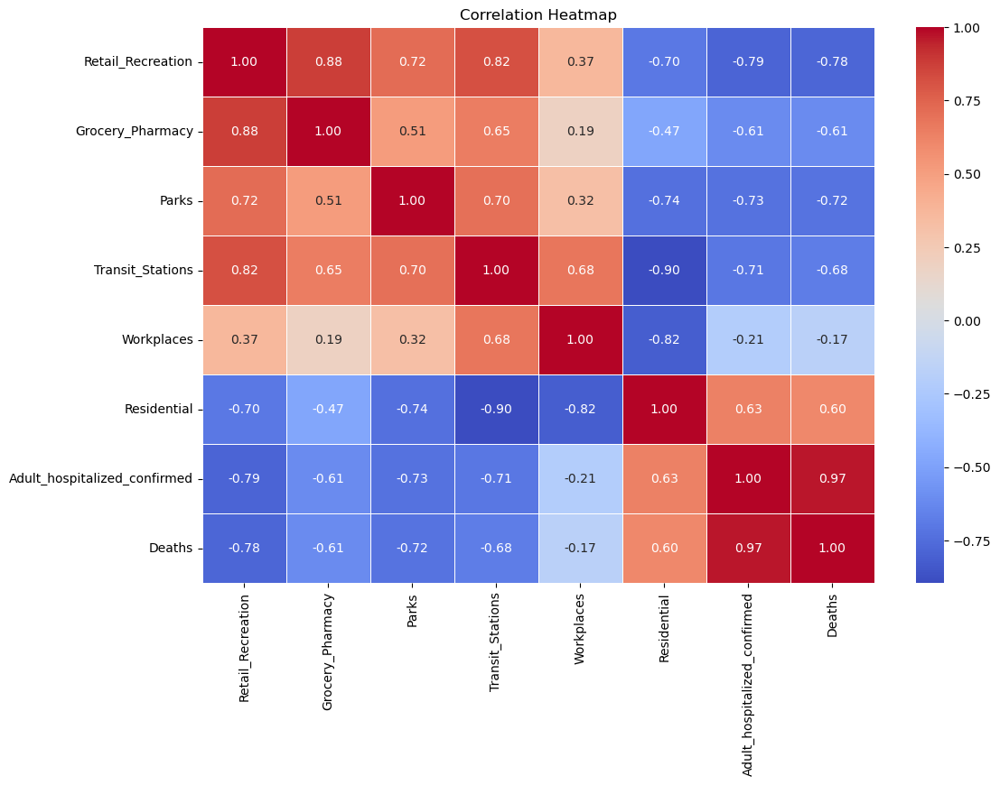

,Retail_Recreation,Grocery_Pharmacy,Parks,Transit_Stations,Workplaces,Residential,Adult_hospitalized_confirmed,Deaths
Retail_Recreation,1.000000,0.880804,0.715109,0.818977,0.365272,-0.695841,-0.786249,-0.783628
Grocery_Pharmacy,0.880804,1.000000,0.514522,0.647740,0.189574,-0.474913,-0.607726,-0.606970
Parks,0.715109,0.514522,1.000000,0.700282,0.322325,-0.736802,-0.730443,-0.722042
Transit_Stations,0.818977,0.647740,0.700282,1.000000,0.678384,-0.895651,-0.710460,-0.680441
Workplaces,0.365272,0.189574,0.322325,0.678384,1.000000,-0.819535,-0.207193,-0.173417
Residential,-0.695841,-0.474913,-0.736802,-0.895651,-0.819535,1.000000,0.629891,0.603296
Adult_hospitalized_confirmed,-0.786249,-0.607726,-0.730443,-0.710460,-0.207193,0.629891,1.000000,0.965070
Deaths,-0.783628,-0.606970,-0.722042,-0.680441,-0.173417,0.603296,0.965070,1.000000


In [7]:
## Calculate and visualize the correlation matrix

# Import US_Mobility data 
dfmobi = pd.read_csv('US_Mobility.csv')
dfmobi.head()
selected_columns = ['place_id', 'date', 
                    'retail_and_recreation_percent_change_from_baseline',
                    'grocery_and_pharmacy_percent_change_from_baseline',
                    'parks_percent_change_from_baseline',
                    'transit_stations_percent_change_from_baseline',
                    'workplaces_percent_change_from_baseline',
                    'residential_percent_change_from_baseline']


dfmobi['date'] = pd.to_datetime(dfmobi['date'])                    
dfmobi=dfmobi[selected_columns]
dfmobi= dfmobi[(dfmobi['place_id'].isin(['ChIJqaUj8fBLzEwRZ5UY3sHGz90'])) & 
                  (dfmobi['date'] >= '2021-01-01') & 
                  (dfmobi['date'] <= '2021-12-31')]

# dfcovid_filter
dfmobi.set_index('date', inplace=True)

df_merged = pd.concat([dfmobi, dfcovid_filter],axis=1)

df_merged.columns = ['Place_ID', 'Retail_Recreation', 'Grocery_Pharmacy', 'Parks',
              'Transit_Stations', 'Workplaces', 'Residential','Adult_hospitalized_confirmed', 'Deaths']

# Initializing MinMaxScaler
scaler = MinMaxScaler()

# Select the columns to be normalized (except the 'Place_ID' column)
cols_to_normalize = df_merged.columns.difference(['Place_ID'])

# Normalize these columns
df_merged[cols_to_normalize] = scaler.fit_transform(df_merged[cols_to_normalize])

# Calculate the correlation coefficient matrix
correlation_matrix = df_merged.drop(['Place_ID'], axis=1).corr()


# Heatmap plotting
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show() 
correlation_matrix


## Correlation Matrix Analysis

The correlation heatmap measures the linear relationships between different indicators of the Google Mobility dataset. The values in the matrix range from -1 to 1, where:

- **-1** indicates a perfect negative correlation,
- **0** indicates no correlation, and
- **1** indicates a perfect positive correlation.

The following is the analysis based on the values of these correlations:

### Correlation of Retail Recreation with Other Indicators:

- **Retail Recreation** exhibits a remarkably strong correlation with **Grocery Pharmacy** (0.88), indicating a robust positive relationship. This suggests a synchronization between activities in retail and recreation with purchases in groceries and pharmacies.

- **Retail Recreation** also demonstrates a substantial positive correlation with **Parks** (0.72), implying a highly positive relationship between outdoor park activities and retail and recreation activities. Additionally, it maintains a notably high correlation with **Transit Stations** (0.82).

- Moreover, **Retail Recreation** has a relatively moderate correlation with **Workplaces** (0.37), showcasing a distinct but less pronounced association.

### Correlation of Grocery Pharmacy with Other Indicators:

- Besides the strong positive correlation with **Retail Recreation**, **Grocery Pharmacy** also shows a moderate positive correlation with **Transit Stations** (0.65) and **Parks** (0.51).

### Correlation of Parks with Other Indicators:

- **Parks** exhibit a strong positive correlation with **Retail Recreation** (0.72) and **Transit Stations** (0.70), suggesting a synchronization between outdoor park activities and these activities.

### Correlation of Transit Stations with Other Indicators:

- **Transit Stations** have strong positive correlations with **Retail Recreation** (0.82), **Parks** (0.70), and **Grocery Pharmacy** (0.65), indicating a potential association with changes in these activities.

### Correlation of Workplaces with Other Indicators:

**Workplaces** represents the level of activity in places of work, such as offices, factories, commercial areas, etc.

- **Correlation with Retail Recreation**: 0.365272, indicating a moderate positive correlation with retail and recreation activities.

- **Correlation with Transit Stations**: 0.678384, suggesting a moderate positive correlation with activities near transit stations.

- **Correlation with Residential**: -0.819535, showing a strong negative correlation with activities at residential places.

### Correlation of Residential with Other Indicators:

- **Residential** shows negative correlations with **Retail Recreation** (-0.70), **Transit Stations** (-0.89), and **Parks** (-0.74), indicating a decrease in these activities as residential activity increases.

### Correlation of Adult hospitalized confirmed and Deaths with Other Indicators:

- There is an extremely strong positive correlation between **Adult hospitalized confirmed** and **Deaths** (0.97), suggesting a high correlation between confirmed hospitalized cases in adults and the number of deaths.

#### Adult hospitalized confirmed and Other Indicators:

- **Retail Recreation and Grocery Pharmacy**: Both "Retail Recreation" (-0.79) and "Grocery Pharmacy" (-0.61) show a strong negative correlation with "Adult hospitalized confirmed". This suggests that higher activity in retail and grocery/pharmacy sectors is associated with a decrease in the number of adult hospitalized confirmed cases.

- **Parks**: "Parks" (-0.73) also displays a notable negative correlation with "Adult hospitalized confirmed". This implies that more activity in parks is associated with a decrease in adult hospitalized confirmed cases.

- **Transit Stations**: "Transit Stations" (-0.71) has a strong negative correlation with "Adult hospitalized confirmed". This indicates that higher activity around transit stations is correlated with a decrease in the number of adult hospitalized confirmed cases.

- **Workplaces**: "Workplaces" (-0.21) has a relatively weaker negative correlation with "Adult hospitalized confirmed". The correlation suggests that higher activity in workplaces is somewhat associated with a decrease in adult hospitalized confirmed cases.

- **Residential**: "Residential" (0.63) exhibits a strong positive correlation with "Adult hospitalized confirmed". This indicates that an increase in residential activity is associated with an increase in the number of adult hospitalized confirmed cases.

### Deaths and Other Indicators:

- **Retail Recreation and Grocery Pharmacy**: Similar to "Adult hospitalized confirmed", both "Retail Recreation" (-0.78) and "Grocery Pharmacy" (-0.61) demonstrate a strong negative correlation with "Deaths". This suggests that higher activity in retail and grocery/pharmacy sectors is associated with a decrease in the number of deaths.

- **Parks**: "Parks" (-0.72) also displays a notable negative correlation with "Deaths", indicating that more activity in parks is associated with a decrease in the number of deaths.

- **Transit Stations**: "Transit Stations" (-0.68) has a strong negative correlation with "Deaths", implying that higher activity around transit stations is correlated with a decrease in the number of deaths.

- **Workplaces**: "Workplaces" (-0.17) has a relatively weaker negative correlation with "Deaths", suggesting that higher activity in workplaces is somewhat associated with a decrease in the number of deaths.

- **Residential**: "Residential" (0.60) exhibits a strong positive correlation with "Deaths", indicating that an increase in residential activity is associated with an increase in the number of deaths.


In [8]:
#Determine elements of strong correlation
def check_strong_correlation(correlation_dict, threshold=0.7):
    
    strong_correlations = []
    
    for i, correlation_coefficient in correlation_dict.items():
        if abs(correlation_coefficient) >= threshold and correlation_coefficient != 1.0:
            strong_correlations.append((i, correlation_coefficient))

    return strong_correlations


correlation_confirmed=correlation_matrix['Adult_hospitalized_confirmed']
strong_confirmed=check_strong_correlation(correlation_confirmed)

correlation_deaths=correlation_matrix['Deaths']
strong_deaths=check_strong_correlation(correlation_deaths)

print('The high correlation between confirmed number and onther indecators:',strong_confirmed)
print('The high correlation between deaths number and onther indecators:',strong_deaths)

The high correlation between confirmed number and onther indecators: [('Retail_Recreation', -0.7862485622651575), ('Parks', -0.730442635152799), ('Transit_Stations', -0.7104600729971495), ('Deaths', 0.9650701771452177)]
The high correlation between deaths number and onther indecators: [('Retail_Recreation', -0.7836276981167368), ('Parks', -0.7220418391693083), ('Adult_hospitalized_confirmed', 0.9650701771452177)]


## High Correlation with Confirmed Cases:

- **Retail Recreation**:
  - A strong negative correlation (approximately -0.7862) with confirmed cases suggests that reduced activity in retail and recreation areas is associated with an increase in confirmed hospitalizations. This implies that people are potentially following guidelines and reducing non-essential outings when case numbers rise.

- **Parks**:
  - Another strong negative correlation (approximately -0.7304) indicates that decreased park activities align with higher confirmed cases. It could imply that outdoor gatherings and activities in parks have decreased to minimize the spread of the virus.

- **Transit Stations**:
  - The negative correlation (approximately -0.7105) suggests that reduced activities around transit stations coincide with an increase in confirmed cases. This might be due to fewer people utilizing public transit to avoid potential exposure.


## High Correlation with Deaths:

- **Retail Recreation**:
  - A strong negative correlation (approximately -0.7836) between retail and recreation activities and deaths indicates that decreased activity in these sectors might be associated with a reduction in mortality rates. It's plausible that when people limit non-essential activities, the risk of mortality decreases.

- **Parks**:
  - Similarly, a strong negative correlation (approximately -0.7220) suggests that fewer park activities might be linked to a lower number of deaths. This could be due to fewer gatherings and interactions in outdoor spaces.



In [9]:
# Plot trends for each data column separately
def plot(strong_list, df_merged):
    data_columns = [item[0] for item in strong_list]
    
    if strong_list == strong_confirmed:
        reference_column = 'Adult_hospitalized_confirmed'
        reference_label = 'Adult Hospitalized (Confirmed Cases)'
    elif strong_list == strong_deaths:
        reference_column = 'Deaths'
        reference_label = 'Deaths'
    else:
        raise ValueError("Invalid strong_list provided.")
    
    for column in data_columns:
        plt.figure(figsize=(12, 4))
        plt.plot(df_merged.index, df_merged[column], label=column)
        plt.plot(df_merged.index, df_merged[reference_column], label=reference_label, linestyle='--')
        plt.xlabel('Date')
        plt.ylabel('Normalized Value')
        plt.title(f'Trend of {column} with {reference_label}')
        plt.legend()
        plt.show()

## Data analysis for highly correlated mobility and corona-infection data

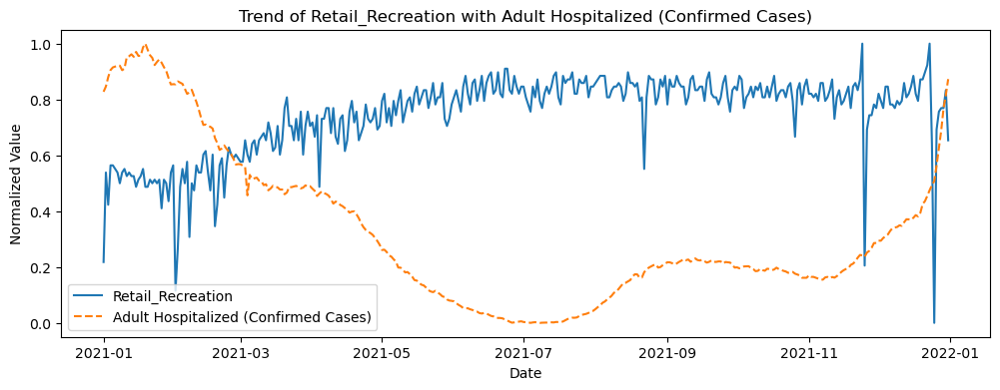

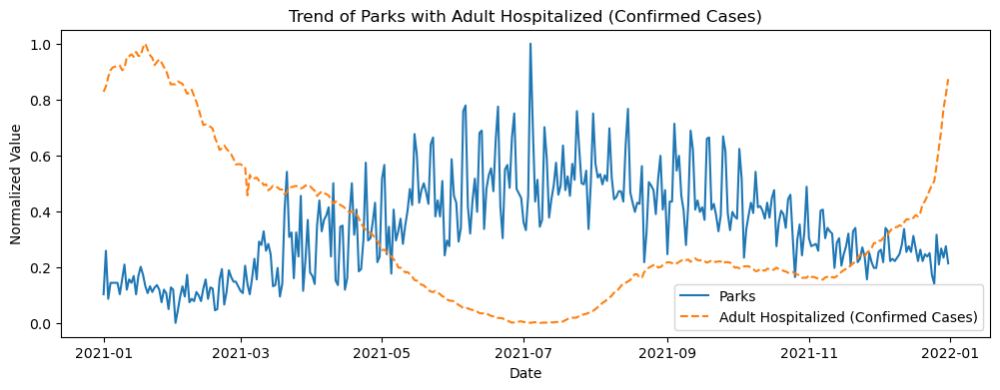

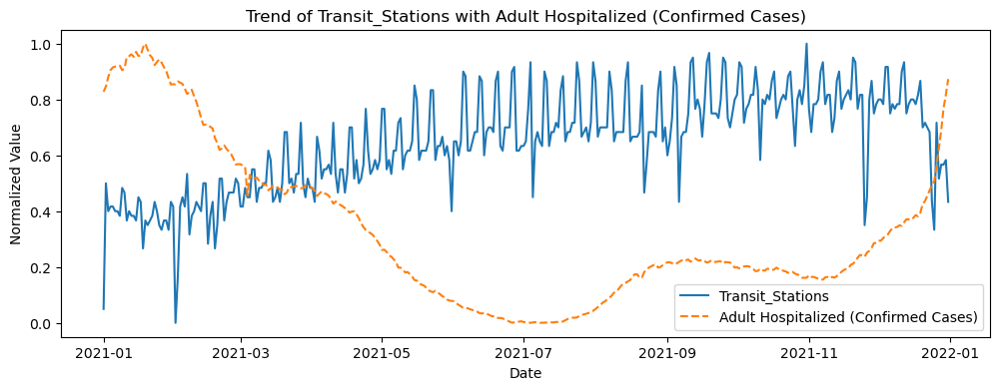

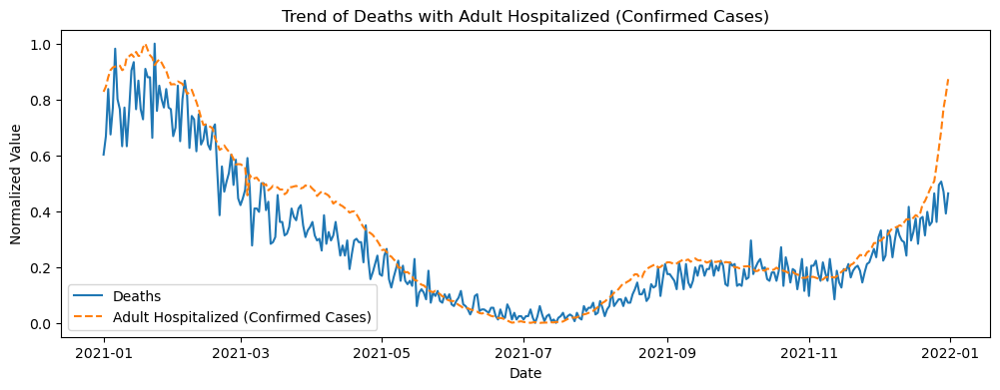

In [10]:
plot(strong_confirmed, df_merged)

The graphs exhibited the relationship between mobility trends in New York State and the number of adult hospitalizations due to COVID-19 over the course of a year from January 2021 to January 2022. Each graph shows the normalized values of a specific type of mobility or outcome against the normalized values of adult hospitalizations for confirmed cases.

**Retail and Recreation with Adult Hospitalized (Confirmed Cases)**: In this graph, the blue line representing retail and recreation activity fluctuates throughout the year but generally exhibits declines during periods where the orange dashed line, representing adult hospitalizations, peaks. This suggests that when COVID-19 hospitalizations increased, activities at retail and recreation locations decreased, possibly due to lockdown measures, restrictions, or voluntary changes in public behavior to reduce the risk of transmission.

**Parks with Adult Hospitalized (Confirmed Cases)**: The activity in parks does not show as strong an inverse correlation with hospitalizations as retail and recreation do. In fact, during some periods where hospitalizations increased, park visits also increased, possibly because outdoor spaces were seen as safer alternatives for leisure activities and exercise, especially when indoor venues were restricted, however, if we do not look so closely and due to the fact of their correlationship is over 0.7, we can say it is inversely correlated in general.

**Transit Stations with Adult Hospitalized (Confirmed Cases)**: Similar to retail and recreation, the use of transit stations also generally decreases as hospitalizations increase. This could be due to reduced commuting because of remote work policies, lockdowns, or a public preference to avoid crowded places such as transit hubs to lower the risk of contracting the virus.

**Deaths with Adult Hospitalized (Confirmed Cases)**: There's a visible correlation between the trends in deaths and adult hospitalizations, with both metrics rising and falling in tandem. This suggests a direct relationship between the severity of the COVID-19 outbreak and mortality rates. Increases in hospitalization are mirrored by increases in deaths, indicating the periods when the healthcare system was under the most strain.

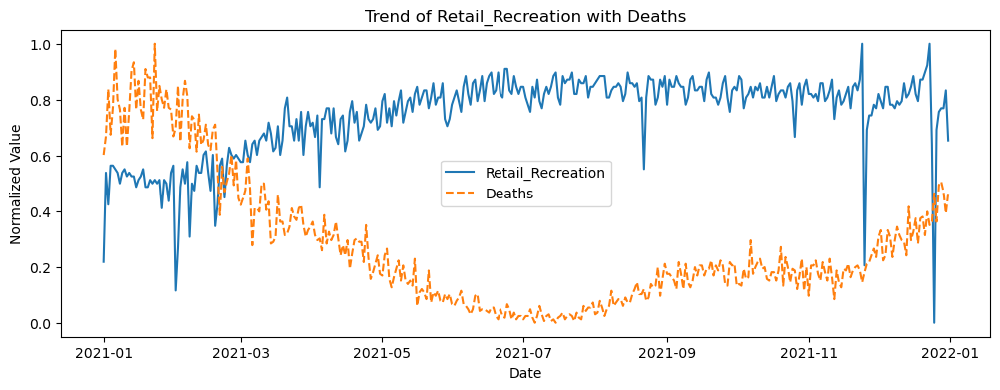

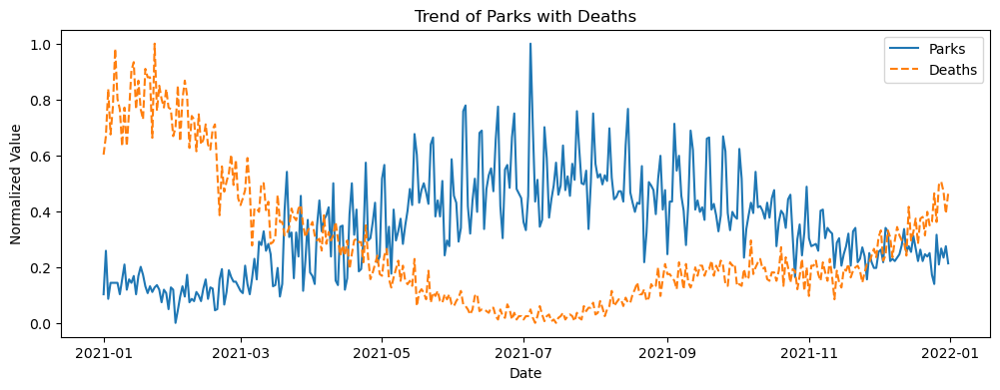

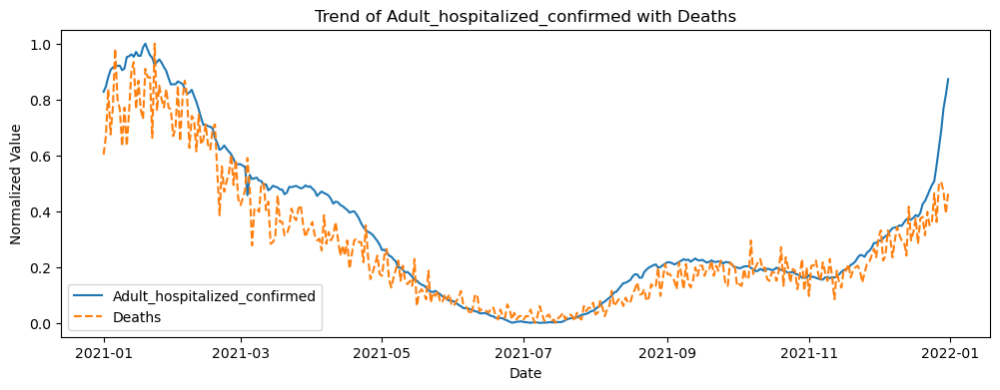

In [11]:
plot(strong_deaths, df_merged)

These three graphs present a comparison of different public activities and COVID-19 related deaths in New York State, showing the data trends from January 2021 to January 2022.

**Trend of Retail_Recreation with Deaths**: This graph illustrates the relationship between the normalized value of visits to retail and recreation venues (solid blue line) and the normalized value of COVID-19 related deaths (dashed orange line). There appears to be an inverse relationship in some portions of the graph where deaths peak, particularly in the earlier months, and retail and recreation activity shows some decline. However, the correlation isn't strictly inverse; there are periods, especially towards the end of the year, where both metrics rise simultaneously, which could indicate changing public behavior or the implementation of new health and safety protocols allowing for increased retail activity even as deaths rise.

**Trend of Parks with Deaths: In the second graph**, the activity in parks (solid blue line) seems less directly correlated with the death rate (dashed orange line). Parks usage shows high variability and does not consistently decline with peaks in the death rate, which suggests that outdoor activities might have been perceived as less risky or that people continued to visit parks for recreation despite the fluctuating death rate due to the pandemic.

**Trend of Adult_hospitalized_confirmed with Deaths**: The third graph shows a very close correlation between the trends in adult hospitalizations for confirmed cases (solid blue line) and deaths (dashed orange line). This is to be expected as more severe cases that lead to hospitalization could subsequently result in higher mortality. The similarity in trends underscores the direct impact of COVID-19 on health outcomes, with deaths lagging slightly behind hospitalizations, as would occur naturally in the progression of the disease.

# Contribution Statement

*Be specific. Some of the tasks can be coding (expect everyone to do this), background research, conceptualisation, visualisation, data analysis, data modelling*

**Max, Li**: Part of background research, research objectives. Coding for data import and processing. Data analysis for highly correlated mobility and corona-infection data. Notebook structure, last check of consistency，export the animations as seperate html files as they cannot be exhibited in the original html file.

**Mingyan, Jin**: Import and analyze the data 'Us_covid.csv' and 'Us_mobility2021.csv', utilizing different chart like Animation, Pie chart and Histogram in visualization, to reflect severity of covid-19 in different states in USA. Therefore select New York to continue study in correlation analysis forward.

**Heran, Zhao**: Objectives of data correlation analysis, conducting correlation analysis, creating and analyzing the correlation heatmap, identifying strong correlations, summarizing the strong correlations results.